# PSTAT 131 Final Project: Food Classification CNN
## By Rachel Pham

# Introduction:
Welcome to my PSTAT 131 Final Project! I will be taking you through my machine learning project today: the introduction, data exploration, data visualization, model building process, and conclusion. The purpose of this project is to **predict the food classification/label given a food image**. We will do this by using three different Convolutional Neural Networks (CNN): MobileNetV2, InceptionV3, and ResNet50. By the end, we will be able to identify the model that provides the best predictions!

<img src="https://64.media.tumblr.com/f5ba3a84e804af08ccfc5b34870ed442/0fd429847930ae33-6c/s1280x1920/e1e50aa000e62d6d1ff996161e2eed3e6fa8a89c.jpg" alt="coverimg" width="700">

Why is this important? Nowadays, with most of our time online, we see so many delicious pictures of food and we sometimes cannot tell what the food is! We could just search up what it is, but we do not even know what it is called. Using machine learning techniques, we could make our lives much easier by simply uploading a picture and getting a result of what food it is! Furthermore, it could be used to classify thousands of images at once for research or work purporses, getting rid of manually labeling images all together.

In this project I will be using this <a href="https://www.kaggle.com/datasets/kmader/food41">dataset</a> from Kaggle that was taken from the Foodspotting website. This dataset has 101 unique food categories and each category has a folder. Within each folder contains 1000 images for that corresponding category Each image has a resolution of (384 x 384 x 3). To break the folder structure down more clearly, within the food41 folder are: 
* **images**: This folder contains 101 folders, each labeled with its unique food category. And within each 101 folders are 1000 food images for that specific food category.
* **meta**: This folder contains the files: "classes.txt" (categories of food in lowercase and underscore format), "labels.txt" (categories of food in uppercase and spaced format), "test.json" (test dataset in json format), "test.txt" (test dataset in word format), "train.json" (train dataset in json format), and "train.txt"(train dataset in word format).

We will go over this more in the Exploratory Data Analysis (EDA) section.

In [1]:
# remove output files
# import shutil
# shutil.rmtree("/kaggle/working/")

## Loading packages and data
First, let us import packages and libraries we need for this project:

In [2]:
# !pip install --upgrade tensorflow-io
# !pip install pyyaml h5py  # Required to save models in HDF5 format

In [3]:
import numpy as np
import pandas as pd
from pathlib import Path
import os.path

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split

import tensorflow as tf
import tensorflow.keras.backend as K
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import load_model
from tensorflow.keras import models
from PIL import Image 
from skimage.io import imread
import cv2

from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.applications import MobileNetV2

from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import *
from tensorflow.keras.applications import *
from tensorflow.keras.callbacks import *
from tensorflow.keras.initializers import *
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import regularizers

from sklearn.metrics import confusion_matrix, classification_report

/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl6StatusC1EN10tensorflow5error4CodeESt17basic_string_viewIcSt11char_traitsIcEENS_14SourceLocationE']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: libtensorflow_io.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so: undefined symbol: _ZTVN10tenso

# Create DataFrame from Raw Data
Right now, our data is just in the input folders as raw files without a choseive file that combines all the information together. To put our data together and perform transformations/edits (if needed), and easy way to to this is to compile the data into a dataframe using Python.

Currently, our data looks like this:
food41 -> images -> meta. Within images, we have 101 folders where each folder has the food category. We can see this in the following code:

In [4]:
folder_path = '/kaggle/input/food41/images'  # Specify the path to the folder

# Get a list of all items in the folder
items = os.listdir(folder_path)

# Use a list comprehension to filter out only the directories
folders = [item for item in items if os.path.isdir(os.path.join(folder_path, item))]

# Count the number of folders
num_folders = len(folders)

print("Number of folders:", num_folders)

Number of folders: 101


Within each food category folder are 1000 images in jpg format of the respective food. 

In the meta folder are "classes.txt" (categories of food in lowercase and underscore format), "labels.txt" (categories of food in uppercase and spaced format), "test.json" (test dataset in json format), "test.txt" (test dataset in word format), "train.json" (train dataset in json format), and "train.txt"(train dataset in word format). For this project, we only need to focus on the food labels/categories and the image filepath. We want a dataframe to clearly visualize our data that has two columns: food label and its corresponding filepath.

In [5]:
# retrieves a list of file paths for all .jpg files found in the specified directory and its subdirectories using the glob module.
image_dir = Path('/kaggle/input/food41/images')
filepaths = list(image_dir.glob(r'**/*.jpg'))
labels = list(map(lambda x: os.path.split(os.path.split(x)[0])[1], filepaths))

We will have separate dataframes: a **bigger dataframe** using all 101 predicted outcomes and 101,000 images and a **smaller dataframe** with 20 predicted outcomes and 20,000 images

When I was first completing this project, I had used all 101 categories and 101,000 images, but I quickly realized that it takes a lot of computing power and time. In this first iteration, I used the MobileNetV2 model. I want to also test it on other CNN models, so I will be downscaling the dataset to output the results more efficiently. For the smaller dataset, I will be testing it on all three CNN models. I will still include the results from the bigger dataframe so we can see the difference in results compared to the smaller dataframe.

In the following code, I will create the two dataframes:

In [6]:
# change the filepaths and labels into panda series
filepaths = pd.Series(filepaths, name='Filepath').astype(str)
labels = pd.Series(labels, name='Label')

# Big dataframe for Mobile Net V2
big_df = pd.concat([filepaths, labels], axis=1)

# Small dataframe for Inception and ResNet
label_samples = []
for label in big_df['Label'].unique():
    label_slice = big_df.query("Label == @label")
    label_samples.append(label_slice)
    if len(label_samples) >= 20:
        break
        
small_df = pd.concat(label_samples, axis=0).sample(frac=1.0, random_state=1).reset_index(drop=True)

Great! We created our dataframes! Let's make sure that our small dataframe has the correct amount of data we need:

In [7]:
small_df

,Filepath,Label
0,/kaggle/input/food41/images/seaweed_salad/1689...,seaweed_salad
1,/kaggle/input/food41/images/bibimbap/3348189.jpg,bibimbap
2,/kaggle/input/food41/images/prime_rib/644122.jpg,prime_rib
3,/kaggle/input/food41/images/pulled_pork_sandwi...,pulled_pork_sandwich
4,/kaggle/input/food41/images/french_toast/14531...,french_toast
...,...,...
19995,/kaggle/input/food41/images/hot_and_sour_soup/...,hot_and_sour_soup
19996,/kaggle/input/food41/images/falafel/190890.jpg,falafel
19997,/kaggle/input/food41/images/guacamole/2345560.jpg,guacamole
19998,/kaggle/input/food41/images/foie_gras/273506.jpg,foie_gras


In [8]:
small_unique_values_count = small_df['Label'].nunique()
print("Number of unique values:", small_unique_values_count)

Number of unique values: 20


Great, that is correct! Now let's take a quick look at only the bigger dataframe to conduct EDA so we can see the entirety of what we are dealing with:

In [9]:
big_df

,Filepath,Label
0,/kaggle/input/food41/images/macarons/2428554.jpg,macarons
1,/kaggle/input/food41/images/macarons/3842133.jpg,macarons
2,/kaggle/input/food41/images/macarons/1963752.jpg,macarons
3,/kaggle/input/food41/images/macarons/1075.jpg,macarons
4,/kaggle/input/food41/images/macarons/2094416.jpg,macarons
...,...,...
100995,/kaggle/input/food41/images/french_fries/36630...,french_fries
100996,/kaggle/input/food41/images/french_fries/25806...,french_fries
100997,/kaggle/input/food41/images/french_fries/33825...,french_fries
100998,/kaggle/input/food41/images/french_fries/13272...,french_fries


In [10]:
unique_values_count = big_df['Label'].nunique()
print("Number of unique values:", unique_values_count)

Number of unique values: 101


Perfect! There is not much else we need to do to this dataframe as the image filepath and food label are both critical information that is needed to build our CNN model.

# Exploring the Data
Let us inspect our new dataframe and learn a little more about it!

In [11]:
print(big_df.shape)

(101000, 2)


In [12]:
big_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101000 entries, 0 to 100999
Data columns (total 2 columns):
 #   Column    Non-Null Count   Dtype 
---  ------    --------------   ----- 
 0   Filepath  101000 non-null  object
 1   Label     101000 non-null  object
dtypes: object(2)
memory usage: 1.5+ MB


Looks like we don't have any null data! That makes it a lot easier as we do not have to deal with any missing data.

In [13]:
big_df['Label'].value_counts()

macarons            1000
steak               1000
gyoza               1000
chocolate_cake      1000
tuna_tartare        1000
                    ... 
fried_calamari      1000
omelette            1000
clam_chowder        1000
shrimp_and_grits    1000
french_fries        1000
Name: Label, Length: 101, dtype: int64

We can see that each 101 food categories have 1000 images corresponding to it. So in all, we have 101,000 images that we can use to train our CNN model.

Let's check if there is any duplicated data. If there is, we would need to handle it accordingly.

In [14]:
big_df.duplicated().sum()

0

Okay, no duplicated data! What about null values?

In [15]:
print(big_df.isnull().sum())

Filepath    0
Label       0
dtype: int64


No null values either! Perfect, then there is no need to tidy the data or apply any other modifications.

## Visual EDA
To understand our data better, let's visualize our data by displaying the images! 

We know that our food labels do not have an imbalance, but let us visualize it through a graph (x-value is food label index and y-value is number of images). This would be important in other datasets that do have a class imbalance:

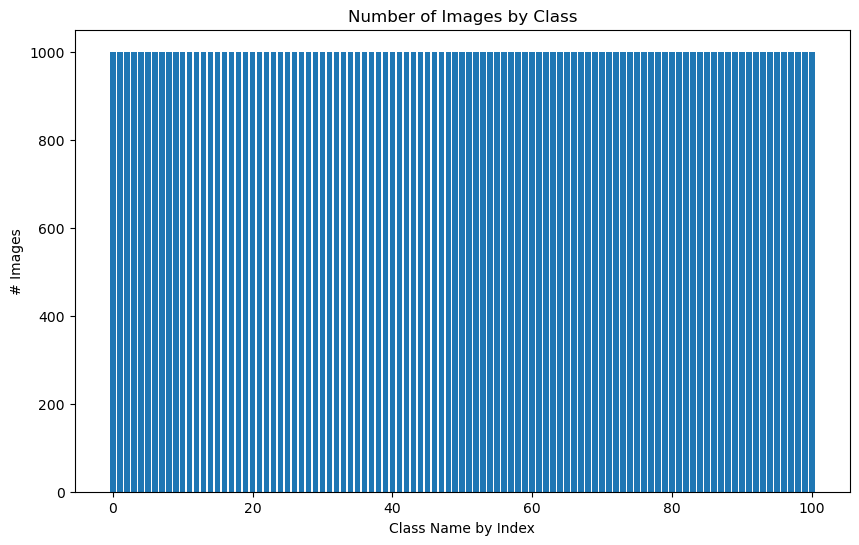

In [16]:
label_counts = big_df['Label'].value_counts()
plt.figure(figsize=(10, 6))  # Adjust the width and height values as desired

plt.bar(range(len(label_counts)), label_counts.values)
plt.title("Number of Images by Class");
plt.xlabel('Class Name by Index');
plt.ylabel('# Images');

As we expected, the dataset is balanced.

Next, we can visualize our dataset by looking at images from each category. We will just visualize 25 random categories due to the size of the dataset:

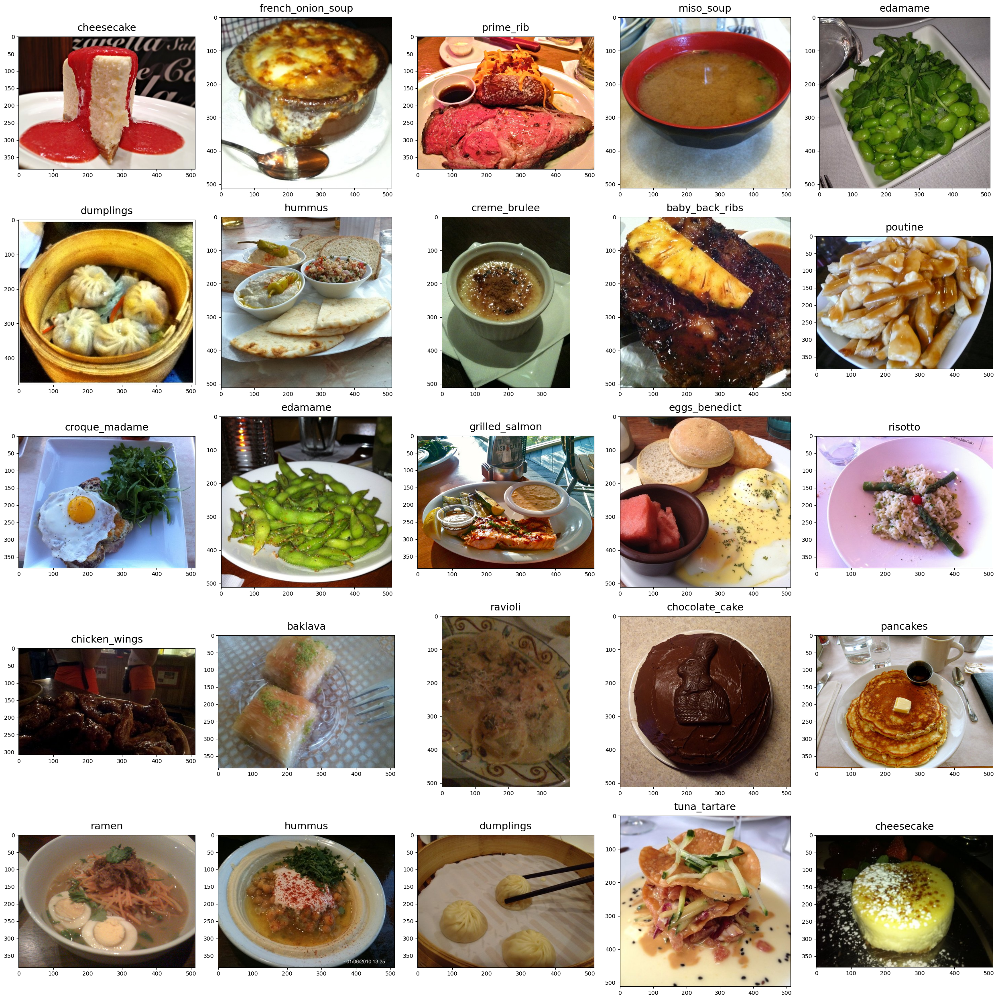

In [17]:
img_folder_dir = "/kaggle/input/food41/images"
selected_labels = np.random.choice(labels, size=25, replace=False)

images = []

for food_folder in selected_labels:
    food_items = os.listdir(img_folder_dir + '/' + food_folder)
    food_selected = np.random.choice(food_items)
    images.append(os.path.join(img_folder_dir, food_folder, food_selected))
                                     
fig = plt.figure(1, figsize=(25, 25))

for subplot, image_ in enumerate(images):
    category = image_.split('/')[-2]
    imgs = plt.imread(image_)
    a, b, c = imgs.shape
    fig = plt.subplot(5, 5, subplot+1)
    fig.set_title(category, pad=10, size=18)
    plt.imshow(imgs)
    
plt.tight_layout()


The dataset is clearly very yummy! We can also see that the images are not all consistent with each other. This is important to note because to use images in machine learning models, we have to make sure to rescale/resize the image so that it would work well with models; the specific rescaling values are based on the model you are using. We handle this by using preprocessing input functions on the images so that they are consistent with the model.

Before setting up the model, I also want to go over **data augmentation**, something we will be implementing while setting up the models. Data augmentation is the method of applying transformations to the training data such as rotations, flips, crops, brightness, change, zooms, and translations. This is important in image classification because it helps to increase training data which ultimately creates a more robust representation of the data and improves model generalization. To understand this topic better, let us plot an example image and apply the augmentation methods to it to see what it looks like:

In [18]:
img_sample = plt.imread('/kaggle/input/food41/images/sushi/1060699.jpg')
dims = np.shape(img_sample)
matrix = np.reshape(img_sample, (dims[0] * dims[1], dims[2]))
print(np.shape(matrix))

(262144, 3)


Image shape ->  (512, 512)
Color channels ->  3


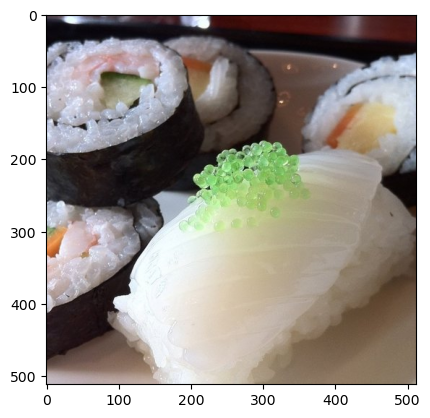

In [19]:
plt.imshow(img_sample)
print("Image shape -> ",dims[:2])
print("Color channels -> ",dims[2])

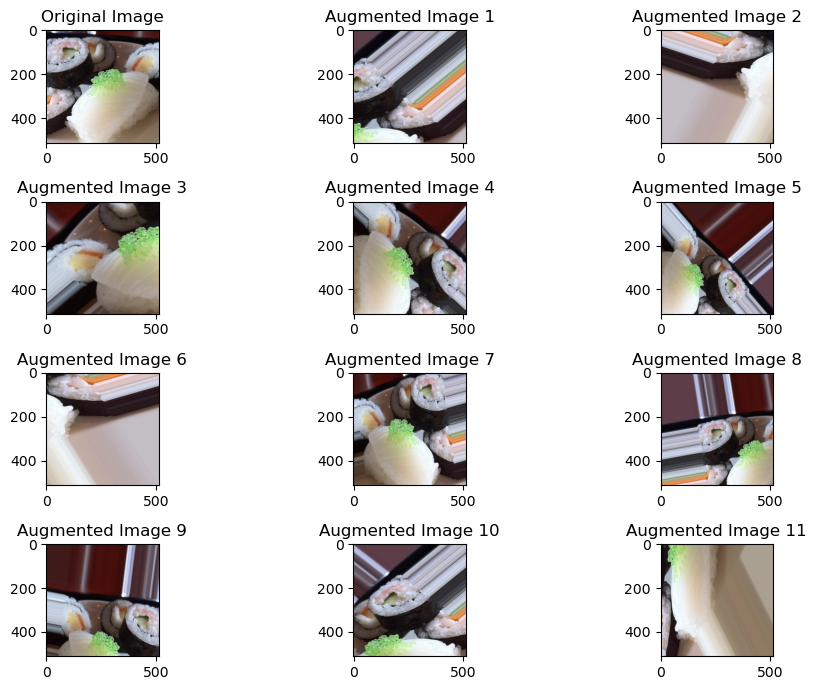

In [20]:
from PIL import Image

# Convert the image to a NumPy array
img_array = np.array(img_sample)

# Reshape the image array to have a batch dimension
img_array = img_array.reshape((1,) + img_array.shape)

# Create an instance of ImageDataGenerator for data augmentation
datagen = ImageDataGenerator(
    rotation_range=50,  # Random rotation between -20 and +20 degrees
    width_shift_range=0.6,  # Random horizontal shift
    height_shift_range=0.6,  # Random vertical shift
    shear_range=0.3,  # Random shear transformation
    zoom_range=0.4,  # Random zoom in/out
    horizontal_flip=True,  # Random horizontal flip
    fill_mode='nearest'  # Fill mode for newly created pixels
)

# Generate augmented images
augmented_images = []
num_augmented_images = 11  # Number of augmented images to generate

for _ in range(num_augmented_images):
    augmented_img_array = datagen.flow(img_array, batch_size=1)[0][0]
    augmented_image = Image.fromarray(augmented_img_array.astype('uint8'))
    augmented_images.append(augmented_image)

# Create the figure with the desired size
plt.figure(figsize=(10, 7))

# Plot the original image
plt.subplot(4, 3, 1)
plt.imshow(img_sample)
plt.title('Original Image')

# Plot the augmented images
for i, augmented_image in enumerate(augmented_images):
    plt.subplot(4, 3, i + 2)
    plt.imshow(augmented_image)
    plt.title(f'Augmented Image {i+1}')

plt.tight_layout()
plt.show()

As we can see, each 11 augmented image are altered in some way. By incorporating these data augmentation techniques, the generator enhances the training data by creating additional variations of the original images. This augmentation helps expose the model to a wider range of scenarios, improving its ability to handle diverse inputs and ultimately leading to better performance.

# Setting Up Models
## Model Building Process
In this project, I will be fitting the following Convolutional Neural Network models: **MobileNetV2, InceptionV3, and ResNet50**. Because CNN's take very long to run and requires a lot of computing power, I will be commenting out the training code and loading in models that I had previously saved and ran locally. You can find more information through my GitHub: https://github.com/phamrachel17/Food-Image-Classification

Before building the models, I want to give a brief introduction to each of the CNN models and how they differ from each other:
* **MobileNetV2**: A lightweight (computationally efficient) CNN that uses depthwise separable convolutions and ultimately reduces the computational cost. This model is best in cases with limited resources. MobileNet focuses on efficiency. 
* **InceptionV3**: Inception is more advanced that MobileNet because it has a deeper architecture and uses multiple parallel convolutional layers. Overall, Inception captures features at multiple scales using inception modules.
* **ResNet50**: ResNet stands for Residual Network and also has a deep architecture. It uses the concept of residual blocks which contains skip connections, allowing the network to propagate gradients. Overall, ResNet uses skip connections to allow the ease of gradient flow.

The model building process for the three **CNN models** will be as follows:
1. Split Data into train, validation, and test
2. Create Generators and perform Data Augmentation
3. Use Generator to load in Image Data from DataFrame
4. Start Modeling using pretrained model (MobileNet, ResNet, or Inception)
5. Train the Model
6. Hyperparameter Tuning
7. Model Evaluation and Saving
8. Prediction

### Train/Test Split
Now we start split the big_df and small_df into training and testing sets. For both, the training size will be 70% of the data:

In [21]:
# Train/Test Split for big_df
train_big_df, test_big_df = train_test_split(big_df, train_size=0.7, shuffle=True, random_state=1)

# Train/Test Split for small_df
train_small_df, test_small_df = train_test_split(small_df, train_size=0.7, shuffle=True, random_state=1)

# Building Prediction Models
## Creating Generators and Data Augmentation
**Generators** in CNN are essential for efficient data loading and preprocessing during the training process. They provide a way to generate small batches of data on-the-fly, feeding them into the model incrementally instead of loading the entire dataset at once. This approach saves memory and allows for seamless training with large datasets.

One of the benefits of using generators is the ability to apply real-time data augmentation techniques to the input images. Data augmentation helps increase the diversity and variability of the training data by applying various transformations, leading to better generalization and robustness of the trained model.

In the code provided, two generators, train_data_generator and test_data_generator, are created. Each generator is associated with a **preprocessing function from tf.keras** that prepares the input images specifically for the MobileNetV2, Inception, and ResNet model architectures. These predefined preprocessing functions take care of reshaping/rescaling the images to fit the model's requirements, normalizing the data, and ensuring dimension compatibility with the chosen models. This function replaces the manual preprocessing work.

We will also apply our own data augmentation to the images, such as rotating them between -30 to 30 degrees, shifting the width horizontally by up to 20%, shifting the height vertically by up to 20% in either direction, distorting the image by 20% along the axes, zooming in or out by 20%, and randomly flipping the image horizontally with a 50% probability.

In the following code, I have created my own data augmentation/preprocessing function so that it can be reused for different CNN models:

In [22]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

def data_aug(preprocess_input):
    train_data_aug = ImageDataGenerator(
        preprocessing_function = preprocess_input,
        validation_split=0.2,
        rotation_range=30,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True
    )

    test_data_aug = ImageDataGenerator(
        preprocessing_function = preprocess_input
    )
    
    return train_data_aug, test_data_aug
    

### DATA_AUG FOR MOBILE NET ###
mobilenet_train_data_aug, mobilenet_test_data_aug = data_aug(tf.keras.applications.mobilenet_v2.preprocess_input)

### DATA_AUG FOR INCEPTION ###
inception_train_data_aug, inception_test_data_aug = data_aug(tf.keras.applications.inception_v3.preprocess_input)

### DATA_AUG FOR RESNET ###
resnet_train_data_aug, resnet_test_data_aug = data_aug(tf.keras.applications.resnet50.preprocess_input)

Great, now after performing the data augmentation and preprocessing, we can create generators and feed in the input images in batches using the ".flow_from_dataframe" function. This facilitates the preprocessing and augmentation of data during the training, validation, and testing stages of the models.

In [23]:
def create_generator(train_model_data_aug, test_model_data_aug, train_dataframe, test_dataframe, target_size_input):
    train_generator = train_model_data_aug.flow_from_dataframe(
        dataframe = train_dataframe,
        x_col = 'Filepath',
        y_col = 'Label',
        target_size = target_size_input,  
        color_mode = 'rgb',
        class_mode = 'categorical',
        batch_size = 32,
        shuffle = True,
        seed = 42,
        subset = 'training'
    )

    val_generator = train_model_data_aug.flow_from_dataframe(
        dataframe = train_dataframe,
        x_col ='Filepath',
        y_col ='Label',
        target_size = target_size_input,
        color_mode='rgb',
        class_mode='categorical',
        batch_size = 32,
        shuffle = True,
        seed = 42,
        subset = 'validation'
    )

    test_generator = test_model_data_aug.flow_from_dataframe(
        dataframe = test_dataframe,
        x_col = 'Filepath',
        y_col = 'Label',
        target_size = target_size_input,
        color_mode = 'rgb',
        class_mode = 'categorical',
        batch_size = 32,
        shuffle = False
    )
    
    return train_generator, val_generator, test_generator

    
### GENERATORS FOR MOBILE NET ###
big_mobilenet_train_generator, big_mobilenet_val_generator, big_mobilenet_test_generator = create_generator(mobilenet_train_data_aug, mobilenet_test_data_aug, train_big_df, test_big_df, (224, 224))
mobilenet_train_generator, mobilenet_val_generator, mobilenet_test_generator = create_generator(mobilenet_train_data_aug, mobilenet_test_data_aug, train_small_df, test_small_df, (224, 224))
print("Mobile Net generators created! \n")

### GENERATORS FOR INCEPTION ###
inception_train_generator, inception_val_generator, inception_test_generator = create_generator(inception_train_data_aug, inception_test_data_aug, train_small_df, test_small_df, (299, 299))
print("Inception generators created! \n")

### GENERATORS FOR RESNET ###
resnet_train_generator, resnet_val_generator, resnet_test_generator = create_generator(resnet_train_data_aug, resnet_test_data_aug, train_small_df, test_small_df, (224, 224))
print("ResNet generators created! \n")

Found 56560 validated image filenames belonging to 101 classes.
Found 14140 validated image filenames belonging to 101 classes.
Found 30300 validated image filenames belonging to 101 classes.
Found 11200 validated image filenames belonging to 20 classes.
Found 2800 validated image filenames belonging to 20 classes.
Found 6000 validated image filenames belonging to 20 classes.
Mobile Net generators created! 

Found 11200 validated image filenames belonging to 20 classes.
Found 2800 validated image filenames belonging to 20 classes.
Found 6000 validated image filenames belonging to 20 classes.
Inception generators created! 

Found 11200 validated image filenames belonging to 20 classes.
Found 2800 validated image filenames belonging to 20 classes.
Found 6000 validated image filenames belonging to 20 classes.
ResNet generators created! 



## Modeling
Now, we can start modeling. We will first use a pretrained model (MobileNetV2) from tf.keras.applications. This model is useful because it will be used as a feature extractor to extract important features from our images. The MobileNetV2 is reliable as it was trained on the ImageNet dataset (has 1.2 million training images), which is a very large-scale dataset designed for image classification tasks. 

In [24]:
#### MOBILE NET MODELING ###
mobilenet = MobileNetV2(
    input_shape=(224, 224, 3),
    include_top=False,     # we do not want to keep the final classification layer that the original model was trained on (was trained on imagenet dataset). we want our OWN classification layer 
    weights='imagenet'
)

mobilenet.trainable = False     # use a pretrianed model for transfer learning. this is a feature extractor

x = mobilenet.output
x = GlobalAveragePooling2D()(x)
x = Dense(128, activation='relu')(x)
x = Dropout(0.2)(x)
outputs = Dense(20, kernel_regularizer=regularizers.l2(0.005), activation='softmax')(x)

mobilenet_model = tf.keras.Model(mobilenet.input, outputs)

9406464/9406464 [==============================] - 1s 0us/step


Next is the Inception V3 model!

In [25]:
#### INCEPTION MODELING ###
inception = InceptionV3(
    input_shape=(299, 299, 3),
    include_top=False, 
    weights='imagenet'
)

inception.trainable = False

x = inception.output
x = GlobalAveragePooling2D()(x)
x = Dense(128, activation='relu')(x)
x = Dropout(0.2)(x)
outputs = Dense(20, kernel_regularizer=regularizers.l2(0.005), activation='softmax')(x)

inception_model = tf.keras.Model(inception.input, outputs)

87910968/87910968 [==============================] - 4s 0us/step


And lastly, is the ResNet 50 model!

In [26]:
#### RESNET MODELING ###
resnet = ResNet50(
    input_shape=(224, 224, 3), 
    include_top=False,
    weights='imagenet'
)

# Freezing the weights of the pre-trained ResNet50 model to prevent them from being updated during training:
resnet.trainable = False 

x = resnet.output
x = GlobalAveragePooling2D()(x)
x = Dense(128, activation='relu')(x)
x = Dropout(0.2)(x)
outputs = Dense(20, kernel_regularizer=regularizers.l2(0.005), activation='softmax')(x)

resnet_model = Model(resnet.input, outputs)

94765736/94765736 [==============================] - 4s 0us/step


## Training the Model
It is finally time to begin training the three CNN models. We want to monitor the validation loss over the validation accuracy because the loss quantifies how certain the model is about a prediction while the accuracy simply counts the number of correct predictions. We can do this by utilizing tensorflow functions such as ModelCheckpoint and CSVLogger.

**(The actual training functions are commented out due to the lack of computing power to run all 3 training functions in one file).**

Each model is saved so we can load it back in to easily view the results without having to run the training functions again.

In [27]:
### MOBILE NET TRAINING ###
mobilenet_model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

checkpointer = ModelCheckpoint(filepath='v1_mobilenetv2', verbose=1, save_best_only=True)
csv_logger = CSVLogger('history_v1_mobilenetv2.log')

# mobilenet_history = mobilenet_model.fit(
#     mobilenet_train_generator,
#     validation_data = mobilenet_val_generator,
#     epochs = 30,
#     callbacks=[
#         csv_logger, checkpointer,
#         tf.keras.callbacks.EarlyStopping(
#             monitor = 'val_loss',
#             patience = 3,
#             restore_best_weights = True
#         )
#     ]
# )

mobilenet_model.save('model_mobilenetv2.h5')

In [28]:
from tensorflow.keras.optimizers import SGD

### INCEPTION TRAINING ###
inception_model.compile(
    optimizer = 'adam',
    loss = 'categorical_crossentropy',
    metrics = ['accuracy']
)

checkpointer = ModelCheckpoint(filepath='v1_inceptionv3', verbose=1, save_best_only=True)
csv_logger = CSVLogger('history_v1_inceptionv3.log')

# inception_history = inception_model.fit(
#     inception_train_generator,
#     validation_data = inception_val_generator,
#     epochs = 30,
#     callbacks=[
#         csv_logger, checkpointer,
#         tf.keras.callbacks.EarlyStopping(
#             monitor = 'val_loss',
#             patience = 3,
#             restore_best_weights = True
#         )
#     ]
# )

inception_model.save('model_inceptionv3.h5')

In [29]:
### RESNET TRAINING ###
resnet_model.compile(
    optimizer = 'adam',
    loss = 'categorical_crossentropy',
    metrics = ['accuracy']
)

checkpointer = ModelCheckpoint(filepath='v1_resnet50', verbose=1, save_best_only=True)
csv_logger = CSVLogger('history_v1_resnet50.log')

# resnet_history = resnet_model.fit(
#     resnet_train_generator,
#     validation_data = resnet_val_generator,
#     epochs = 30,
#     callbacks=[
#         csv_logger, checkpointer,
#         tf.keras.callbacks.EarlyStopping(
#             monitor = 'val_loss',
#             patience = 3,
#             restore_best_weights = True
#         )
#     ]
# )

resnet_model.save('model_resnet50.h5')

# Model Results
The training is done, so exciting! Let's see how they did compared to each other. First, let us load the models in...

In [30]:
# LOAD MODELS BACK IN # 
from tensorflow.keras.models import load_model

big_mobilenet_model = load_model('/kaggle/input/food-models/model_big_mobilenetv2.h5')
mobilenet_model = load_model('/kaggle/input/food-models/model_mobilenetv2.h5')
inception_model = load_model('/kaggle/input/food-models/model_inceptionv3.h5')
resnet_model = load_model('/kaggle/input/food-models/model_resnet50.h5')

And our saved history files for each model (excluding the big mobile net file). We will convert the CSV files to a dataframe and then a dictionary so that it can be easily read in. These history files contain the final training accuracies for each model!

In [31]:
# Convert the DataFrame into a dictionary for each model

# Mobile Net 
history_data = pd.read_csv('/kaggle/input/model-history/history_mobilenetv2.csv')
mobilenet_history = {
    'epoch': history_data['epoch'].tolist(),
    'accuracy': history_data['accuracy'].tolist(),
    'val_accuracy': history_data['val_accuracy'].tolist(),
    'loss': history_data['loss'].tolist(),
    'val_loss': history_data['val_loss'].tolist()
}

# Inception
history_data = pd.read_csv('/kaggle/input/model-history/history_inceptionv3.csv')
inception_history = {
    'epoch': history_data['epoch'].tolist(),
    'accuracy': history_data['accuracy'].tolist(),
    'val_accuracy': history_data['val_accuracy'].tolist(),
    'loss': history_data['loss'].tolist(),
    'val_loss': history_data['val_loss'].tolist()
}

# ResNet
history_data = pd.read_csv('/kaggle/input/model-history/history_resnet50.csv')
resnet_history = {
    'epoch': history_data['epoch'].tolist(),
    'accuracy': history_data['accuracy'].tolist(),
    'val_accuracy': history_data['val_accuracy'].tolist(),
    'loss': history_data['loss'].tolist(),
    'val_loss': history_data['val_loss'].tolist()
}

First, let us view the training and validation accuracies for each of the models:

In [32]:
final_training_accuracy_mobilenet = mobilenet_history['accuracy'][-1]
final_training_accuracy_inception = inception_history['accuracy'][-1]
final_training_accuracy_resnet = resnet_history['accuracy'][-1]

print('Mobile Net Train Accuracy: {:.2f}%'.format(final_training_accuracy_mobilenet * 100))
print('Inception Train Accuracy: {:.2f}%'.format(final_training_accuracy_inception * 100))
print('ResNet Train Accuracy: {:.2f}% \n'.format(final_training_accuracy_resnet * 100))

final_val_accuracy_mobilenet = mobilenet_history['val_accuracy'][-1]
final_val_accuracy_inception = inception_history['val_accuracy'][-1]
final_val_accuracy_resnet = resnet_history['val_accuracy'][-1]

print('Mobile Net Val Accuracy: {:.2f}%'.format(final_val_accuracy_mobilenet * 100))
print('Inception Val Accuracy: {:.2f}%'.format(final_val_accuracy_inception * 100))
print('ResNet Val Accuracy: {:.2f}%'.format(final_val_accuracy_resnet * 100))

Mobile Net Train Accuracy: 82.89%
Inception Train Accuracy: 80.63%
ResNet Train Accuracy: 82.31% 

Mobile Net Val Accuracy: 78.75%
Inception Val Accuracy: 79.57%
ResNet Val Accuracy: 80.25%


So we see that MobileNet has the best training accuracy, while Inception has the worst. For validation accuracy, ResNet did the best while MobileNet did the worst.

To determine the actual performance of the model, we have to obtain the test accuracy of each. We can do this by using the .evaluate() function to view the **TEST** accuracy of each!

In [33]:
# Test Accuracy Evaluation
big_mobilenet_results = big_mobilenet_model.evaluate(big_mobilenet_test_generator, verbose=0)
mobilenet_results = mobilenet_model.evaluate(mobilenet_test_generator, verbose=0)
inception_results = inception_model.evaluate(inception_test_generator, verbose=0)
resnet_results = resnet_model.evaluate(resnet_test_generator, verbose=0)

print("Big Mobile Net Test Accuracy: {:.2f}%".format(big_mobilenet_results[1] * 100))
print("Small Mobile Net Test Accuracy: {:.2f}%".format(mobilenet_results[1] * 100))
print("Inception Test Accuracy: {:.2f}%".format(inception_results[1] * 100))
print("ResNet Test Accuracy: {:.2f}%".format(resnet_results[1] * 100))

Big Mobile Net Test Accuracy: 58.11%
Small Mobile Net Test Accuracy: 79.92%
Inception Test Accuracy: 81.82%
ResNet Test Accuracy: 81.47%


So as we can see, the Big Mobile Net model did the worse (58.11%) because for this model, the number of outcomes was 101 food categories. However, 58.11% is a fairly good accuracy considering how many different outcomes there are.

Out of MobileNet, Inception, and ResNet that were all trained on the same number of input data and outcome variables, **Inception V3 did the best with a 81.82% test accuracy**! ResNet is a VERY second close, only 0.35% less in accuracy than Inception. MobileNet did the worse with a 79.92% accuracy.

## Visualizing the Results
Let us now visualize the results. Plotting the validation accuracy and validation loss can help us understand how the results fluctuated throughout the epochs! 

First, I will create helper functions to plot the accuracy and loss:

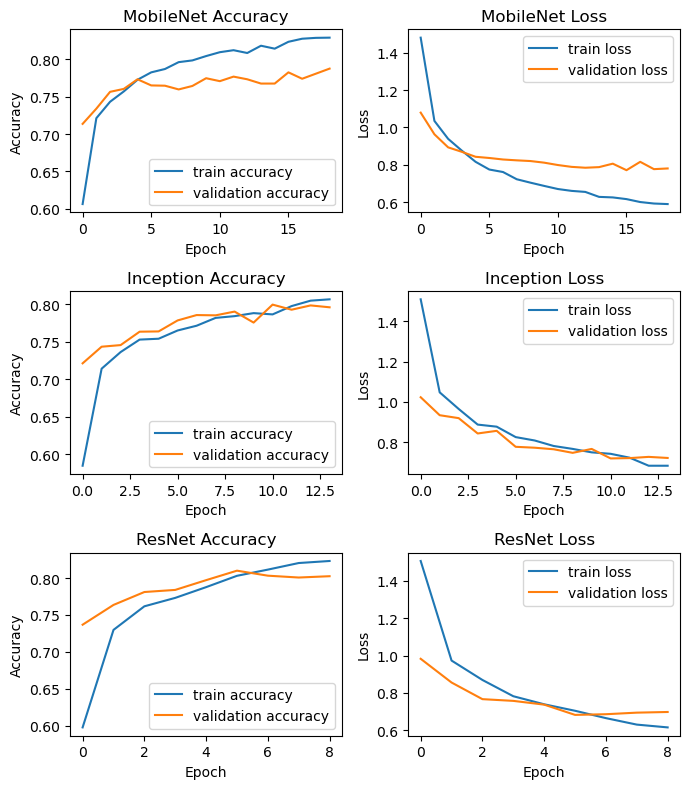

In [34]:
# Helper functions for plotting accuracy and loss
def plot_accuracy(ax, history, model, title):
    ax.plot(history['accuracy'], label='train accuracy')
    ax.plot(history['val_accuracy'], label='validation accuracy')
    ax.set_title(title)
    ax.set_ylabel('Accuracy')
    ax.set_xlabel('Epoch')
    ax.legend(loc='best')

def plot_loss(ax, history, title):
    ax.plot(history['loss'], label="train loss")
    ax.plot(history['val_loss'], label="validation loss")
    ax.set_title(title)
    ax.set_ylabel('Loss')
    ax.set_xlabel('Epoch')
    ax.legend(loc='best')

# Create subplots and specify the size of the figure
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(7, 8))

# Evaluation plots for Mobile Net
plot_accuracy(axes[0, 0], mobilenet_history, mobilenet_model, 'MobileNet Accuracy')
plot_loss(axes[0, 1], mobilenet_history, 'MobileNet Loss')

# Evaluation plots for Inception
plot_accuracy(axes[1, 0], inception_history, inception_model, 'Inception Accuracy')
plot_loss(axes[1, 1], inception_history, 'Inception Loss')

# Evaluation plots for ResNet
plot_accuracy(axes[2, 0], resnet_history, resnet_model, 'ResNet Accuracy')
plot_loss(axes[2, 1], resnet_history, 'ResNet Loss')

# Adjust the spacing between subplots
fig.tight_layout()

# Display the figure
plt.show()

Very interesting! As we can tell by our test accuracy results, Inception does the best even by also looking at these graphs. We can observe that in the Inception graphs, the training accuracy and validation accuracy converge closely together at the end while in MobileNet and ResNet, the lines cross at one point and training accuracy starts to diverge slightly upwards, indicating overfitting.

## Confusion Matrix
Let's also visualize the confusion matrix just our best model, Inception V3. Through a confusion matrix, we can evaluate the performace of the model and is very useful for especially multi-class classification problems. It also helps with identifying specific errors where certain labels may have predicted the wrong labels more than the others. 

In [35]:
# Mobile Net
# mobilenet_predictions = np.argmax(mobilenet_model.predict(mobilenet_test_generator), axis=1)
# mobilenet_cm = confusion_matrix(mobilenet_test_generator.labels, mobilenet_predictions)
# mobilenet_clr = classification_report(mobilenet_test_generator.labels, mobilenet_predictions, target_names=mobilenet_test_generator.class_indices, zero_division=0)

# Inception
inception_predictions = np.argmax(inception_model.predict(inception_test_generator), axis=1)
inception_cm = confusion_matrix(inception_test_generator.labels, inception_predictions)
inception_clr = classification_report(inception_test_generator.labels, inception_predictions, target_names=inception_test_generator.class_indices, zero_division=0)

# ResNet
# resnet_predictions = np.argmax(resnet_model.predict(resnet_test_generator), axis=1)
# resnet_cm = confusion_matrix(resnet_test_generator.labels, resnet_predictions)
# resnet_clr = classification_report(resnet_test_generator.labels, resnet_predictions, target_names=resnet_test_generator.class_indices, zero_division=0)

188/188 [==============================] - 684s 4s/step


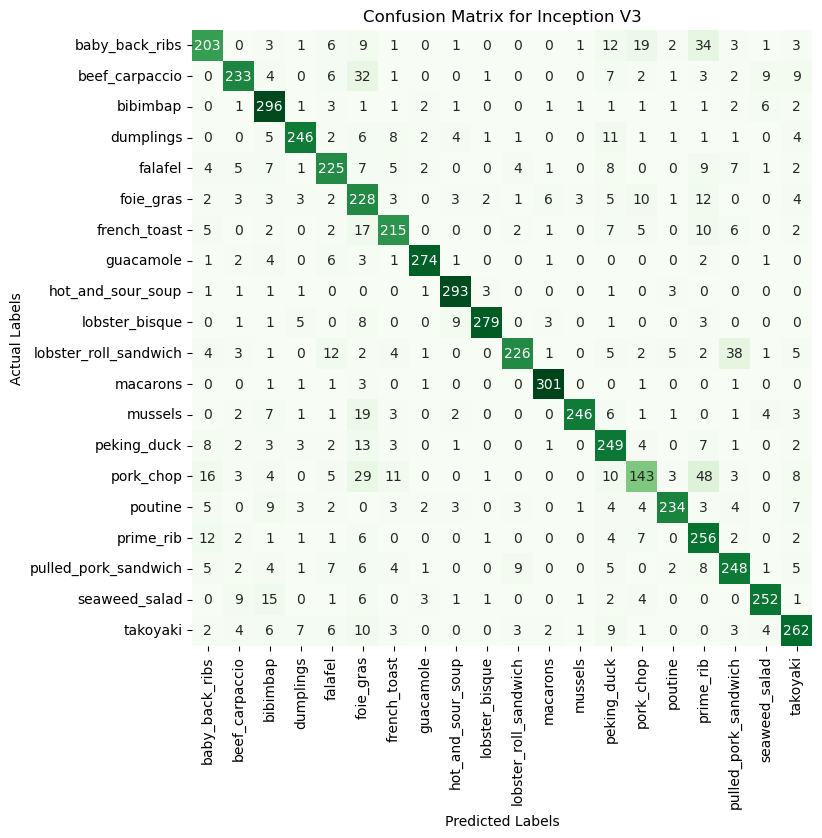

In [36]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8, 8))
sns.heatmap(inception_cm, annot=True, fmt='g', vmin=0, cmap='Greens', cbar=False)
plt.xticks(ticks=np.arange(20) + 0.5, labels=inception_test_generator.class_indices, rotation=90)
plt.yticks(ticks=np.arange(20) + 0.5, labels=inception_test_generator.class_indices, rotation=0)
plt.xlabel("Predicted Labels")
plt.ylabel("Actual Labels")
plt.title("Confusion Matrix for Inception V3")
plt.show()

The diagonal pattern in the confusion matrix tells us that our model did relatively well and predicted the correct labels for the most part! If we do more analysis on the confusion matrix, we can see that some wrong predictions are reasonable. For example, for prime_ribs and pork_chop, there were 48 misclassifications and this makes sense as they look very similar.

We can further observe how our model did by printing out the classification report that states the precision, recall, f1-score, and support values for each of the food labels.

In [37]:
print("Classification Report for Inception V3:\n----------------------\n", inception_clr)

Classification Report for Inception V3:
----------------------
                        precision    recall  f1-score   support

       baby_back_ribs       0.76      0.68      0.72       299
       beef_carpaccio       0.85      0.75      0.80       310
             bibimbap       0.79      0.92      0.85       322
            dumplings       0.89      0.84      0.86       294
              falafel       0.78      0.78      0.78       288
            foie_gras       0.56      0.78      0.66       291
         french_toast       0.81      0.78      0.80       274
            guacamole       0.95      0.93      0.94       296
    hot_and_sour_soup       0.92      0.96      0.94       305
       lobster_bisque       0.97      0.90      0.93       310
lobster_roll_sandwich       0.91      0.72      0.81       312
             macarons       0.95      0.97      0.96       310
              mussels       0.97      0.83      0.89       297
          peking_duck       0.72      0.83      0.77 

# Predictions using the Best Model

And now let's actually put our model to the test with real pictures from the internet! For the test images, I will be using three different ones based on categories the model was trained on: 

In [38]:
pretrained_labels = ['baby_back_ribs', 'beef_carpaccio', 'bibimbap', 'dumplings', 'falafel', 'foie_grass', 'french_toast', 'guacamole', 'hot_and_sour_soup', 'lobster_bisque',
             'lobster_roll_sandwich', 'macarons', 'mussels', 'peking_duck', 'pork_chop', 'poutine', 'prime_rib', 'pulled_porked_sandwich', 'seaweed_salad', 'takoyaki']

def predict_label(model, images, show=True):
    for img_path in images:
        img = image.load_img(img_path, target_size=(299, 299))
        img = image.img_to_array(img)
        img /= 255.

        pred = model.predict(np.expand_dims(img, axis=0))
        predicted_index = np.argmax(pred)        # obtain the MAXIMUM value of the predicted probability from the labels choices
        predicted_label = pretrained_labels[predicted_index]

        if show:
            plt.imshow(img)
            plt.axis('off')
            plt.title(predicted_label)
            print(pred)
            plt.show()

In [39]:
# Download images from internet using their URLs
!wget -O macarons.jpg https://cdn1.harryanddavid.com/wcsstore/HarryAndDavid/images/catalog/19_33463_30GL_01ex.jpg
!wget -O takoyaki.jpg https://as2.ftcdn.net/v2/jpg/00/37/86/09/1000_F_37860909_y2k1YHXeY7qFfNJn4Hlq0fapX2gD6PKu.jpg
!wget -O bibimbap.jpg https://i.imgur.com/VjktDMv.jpg

--2023-06-12 02:53:16--  https://cdn1.harryanddavid.com/wcsstore/HarryAndDavid/images/catalog/19_33463_30GL_01ex.jpg
Resolving cdn1.harryanddavid.com (cdn1.harryanddavid.com)... 151.101.2.126, 151.101.66.126, 151.101.130.126, ...
Connecting to cdn1.harryanddavid.com (cdn1.harryanddavid.com)|151.101.2.126|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 99466 (97K) [image/jpeg]
Saving to: ‘macarons.jpg’

macarons.jpg        100%[===================>]  97.13K  --.-KB/s    in 0.02s   

2023-06-12 02:53:16 (4.98 MB/s) - ‘macarons.jpg’ saved [99466/99466]

--2023-06-12 02:53:18--  https://as2.ftcdn.net/v2/jpg/00/37/86/09/1000_F_37860909_y2k1YHXeY7qFfNJn4Hlq0fapX2gD6PKu.jpg
Resolving as2.ftcdn.net (as2.ftcdn.net)... 151.101.1.167, 151.101.65.167, 151.101.129.167, ...
Connecting to as2.ftcdn.net (as2.ftcdn.net)|151.101.1.167|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 280191 (274K) [image/jpeg]
Saving to: ‘takoyaki.jpg’

takoyaki.jpg     

1/1 [==============================] - 2s 2s/step
[[1.7725474e-03 3.2660825e-04 1.3874299e-03 9.9037681e-04 2.4612951e-01
  8.9907572e-02 6.5174368e-03 3.7525364e-04 2.6672806e-06 1.4811036e-03
  3.7992350e-03 5.5126244e-01 8.2524203e-02 2.4756551e-04 9.3466258e-03
  3.0947654e-04 9.5423986e-04 1.9308814e-03 1.9464645e-04 5.4009241e-04]]


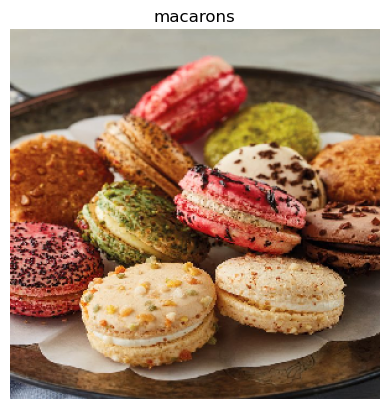

1/1 [==============================] - 0s 146ms/step
[[4.7916891e-03 3.8031969e-04 3.2770759e-03 2.0301307e-03 4.5920223e-02
  7.1794190e-04 1.5908761e-02 1.2083083e-03 4.1943969e-04 4.9413496e-04
  3.7654076e-02 1.0834428e-03 1.7106767e-03 2.7052951e-03 3.2659159e-03
  1.6281834e-02 1.2528719e-03 5.8004162e-03 9.9077530e-05 8.5499829e-01]]


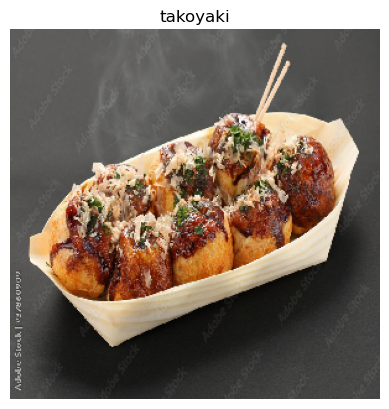

1/1 [==============================] - 0s 147ms/step
[[1.9478234e-03 3.5187809e-04 6.7913306e-01 1.1338563e-02 2.2217980e-02
  3.2217540e-02 6.0855788e-03 2.4212152e-03 3.5485999e-05 6.8217609e-03
  2.0642649e-02 2.0368610e-01 4.3482150e-04 3.4902075e-03 8.0529414e-04
  5.9051358e-04 6.8060315e-04 4.5790598e-03 1.1024972e-03 1.4172420e-03]]


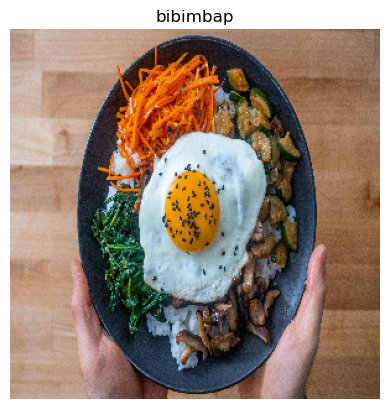

In [40]:
# Test the images
test_images = []
test_images.append('macarons.jpg')
test_images.append('takoyaki.jpg')
test_images.append('bibimbap.jpg')
predict_label(inception_model, test_images, True)

Perfect! The model classified all three images correctly!!

# Conclusion

In this project, we have learned how to explore/visualize data, build three different types of Convolutional Neural Networks, test the models, evaluate the models' accuracy, and use the best model to predict the category labels of images found on the Internet. The three CNN models I chose to implement are MobileNet V2, Inception V3, and ResNet 50. After testing the models, we came to the conclusion that Inception V3 gave the best outcome and classification for the input size of 20 different categories/labels and 20,000 food images. There could be many reasons for why InceptionV3 came out to have the best result: Inception's model architecture fit the best with the data we have, Inception could have handled more complex data in the input data better than the other two models, or Inception could also just have better model capacity. With more research and experimentation, we would be able to pinpoint the exact reasons.

This project could definitely have further improvements done to it! Originally, I had wanted to predict the recipes given food images, but I found it to be very challenging as I was new to the concept of Neural Networks. Starting off with simply classifying food images allowed me a nice introduction to Neural Networks and really helped me understand how to build them from scratch. Eventually, I would like to scale this project up from classifying food given the image to identifying individual foods/ingredients given an image with various foods in it, and then predicting the recipe given an image based on the foods detected in the image. Through past research, I could definitely utilize Mask-RCNN for individual food detection and gather more high-quality data to complete this task.

One of my main goals for this project was to learn more about deep learning and TensorFlow. I achieved exactly that through using online resources! Doing this project made me realize how much work goes into having a machine identify something through an image. For humans, it happens within a split second based on past memories, and it is amazing that a machine can also do this through maybe 50-100 lines of code. As the world gradually becomes more AI-focused, I am glad I did a project like this so I could get a good introduction to machine learning. I know that deep learning and neural networks were not taught in-depth in the class, but I am glad I did this project because it taught me to learn things quickly on my own outside of class and also taught me how to look for the correct resources that would allow me to efficiently get my questions answered.

In terms of our results, I think that all the models did well! Their test accuracies were not too far off from one another. With more research into better layering architecture and hyperparameter tuning, I am sure that the models can improve to achieve better accuracies.

Overall, I had a great time completing this project, and it has been a great opportunity for me to learn more about deep learning, which I hope to work closely with in the future!